In [2]:
import numpy as np
import os
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [3]:
import kagglehub

path = kagglehub.dataset_download("balraj98/massachusetts-roads-dataset")
print("Path to dataset files:", path)
TRAIN_DATA_PATH = path + '/tiff/train'
TRAIN_DATA_LABEL_PATH = path + '/tiff/train_labels'
VAL_DATA_PATH = path + '/tiff/val'
VAL_DATA_LABEL_PATH = path + '/tiff/val_labels'
TEST_DATA_PATH = path + '/tiff/test'
TEST_DATA_LABEL_PATH = path + '/tiff/test_labels'

Path to dataset files: /kaggle/input/datasets/balraj98/massachusetts-roads-dataset


### Augmentation & Normalize

In [4]:
import albumentations as A

transform = A.Compose([
    A.RandomCrop(512, 512),
    A.GaussianBlur(blur_limit=(3,7), p=0.2),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Rotate(limit=15, p=0.5),
    A.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225]),
    A.ToTensorV2()
])


### Class dataset with augmentation

In [ ]:
from collections import deque
import os

class RoadDataset(Dataset):
    def __init__(self, path_dir_image, path_dir_label, direct_len, transforms=None, crop_size=512, resize_to=1024):
        self.samples = []
        self.direct_len = direct_len
        self.transforms = transforms
        self.crop_size = crop_size
        self.resize_to = resize_to
        
        self.crop_queue = deque()
        image_list_path = sorted(os.listdir(path_dir_image))
        
        for file in image_list_path:
            if file.endswith('.tiff'):
                label_file_name = file.replace('.tiff', '.tif')
                full_image_path = os.path.join(path_dir_image, file)
                full_label_path = os.path.join(path_dir_label, label_file_name)
            
                if os.path.exists(full_label_path):
                    self.samples.append((full_image_path, full_label_path))
            
    def __len__(self):
        return self.direct_len
    
    def _generate_crops(self, img_path, mask_path):
        img = Image.open(img_path).convert('RGB')
        mask = Image.open(mask_path).convert('L')
        
        img = img.resize((self.resize_to, self.resize_to), Image.BILINEAR)
        mask = mask.resize((self.resize_to, self.resize_to), Image.NEAREST)
        
        img = np.array(img)
        mask = np.array(mask)
        mask = (mask > 0).astype(np.float32) #1 - дорога, 0 - не дорога
        
        step = self.crop_size
        crops = []
        
        #4 кропа
        for y in range(0, self.resize_to, step):
            if y + step > self.resize_to:
                break
            for x in range(0, self.resize_to, step):
                if x + step > self.resize_to:
                    break
                
                crop_img = img[y:y+step, x:x+step]
                crop_mask = mask[y:y+step, x:x+step]

                #если >80% пикселей белого цвет то не доавляем
                if crop_mask.mean() > 0.8:
                    continue

                crops.append((crop_img, crop_mask))

        if not crops:  # Fallback на слуай все было белое берём верхний левый угол без фильтрации чтобы не вызвать indexerror
            crops.append((img[:self.crop_size, :self.crop_size], 
                      mask[:self.crop_size, :self.crop_size]))
            
        return crops
    
    def __getitem__(self, idx_phantom):
        if len(self.crop_queue) == 0:
            idx_real = idx_phantom % len(self.samples) #зацикит файлы, если их мало, чтобы не выйти за пределы списка
            img_path, mask_path = self.samples[idx_real]
            
            crops = self._generate_crops(img_path, mask_path)
            
            for crop_img, crop_mask in crops:
                self.crop_queue.append((crop_img, crop_mask))
                    
        img, mask = self.crop_queue.popleft()
        
        if self.transforms:
            augmented = self.transforms(image=img, mask=mask)
            img = augmented['image']
            mask = augmented['mask']
        
        mask = (mask > 0).long()
        
        return img, mask

### Datasets & Dataloaders

In [7]:
train_dataset = RoadDataset(path_dir_image=TRAIN_DATA_PATH, path_dir_label=TRAIN_DATA_LABEL_PATH, direct_len=1000, transforms=transform)
val_dataset = RoadDataset(path_dir_image=VAL_DATA_PATH, path_dir_label=VAL_DATA_LABEL_PATH, direct_len=200, transforms=transform)


train_dataloader = DataLoader(
    dataset=train_dataset,
    batch_size=64,  
    shuffle=True,
    num_workers=2,  
    pin_memory=True,
    persistent_workers=True
)

val_dataloader = DataLoader(
    dataset=val_dataset,
    batch_size=16,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
    persistent_workers=True
)

print(f"Размер train: {len(train_dataset)}, {len(train_dataloader)}")
print(f"Размер valid: {len(val_dataset)}, {len(val_dataloader)}")

img, label = train_dataset[1]
print(img.shape, label.shape)

Размер train: 1000, 16
Размер valid: 200, 13
torch.Size([3, 512, 512]) torch.Size([512, 512])


### Functions for saving weights of model and checkpoins of learning

In [ ]:
def save_checkpoint(model, optimizer, scaler,
            train_losses=[], train_ious=[], train_dices=[], train_accs=[],
            val_losses=[], val_ious=[], val_dices=[], val_accs=[],
            epochs_list=[], filename='model/checkpoint.pth'):

    checkpoint = {
        "epoch": len(epochs_list),
        "epochs_list": epochs_list,
        'model_state_dict': model.state_dict(),
        #"model_state_dict": (model.module.state_dict() if isinstance(model, nn.DataParallel) else model.state_dict()),
        "optimizer_state_dict": optimizer.state_dict(),
        "scaler_state_dict": scaler.state_dict(),
        "train_losses": train_losses,
        "train_ious": train_ious,
        "train_dices": train_dices,
        "train_accs": train_accs,
        "val_losses": val_losses,
        "val_ious": val_ious,
        "val_dices": val_dices,
        "val_accs": val_accs,
    }
    torch.save(checkpoint, filename)

def load_checkpoint(filename, model, optimizer, scaler, device):
    checkpoint = torch.load(filename, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
    scaler.load_state_dict(checkpoint["scaler_state_dict"])
    model.to(device)

    print(f" Загружено из эпохи {checkpoint['epoch']}, Train Loss: {checkpoint['train_losses'][-1]:.4f}, Val Loss: {checkpoint['val_losses'][-1]:.4f}")
    return checkpoint['epoch'], checkpoint['train_losses'], checkpoint['train_ious'], checkpoint['train_dices'], checkpoint['train_accs'], checkpoint['val_losses'], checkpoint['val_ious'], checkpoint['val_dices'], checkpoint['val_accs'], checkpoint['epochs_list']

### Модель - U-net с ResNet50 энкодером

In [ ]:
!pip install segmentation_models_pytorch
!mkdir -p model

In [ ]:
1 0
0.9 0.1

1*0.9  + 0 * 0.1


1 - (2* sum(p_i * y_i) + e)/(sum(p_i) + sum(y_i) + e)

SyntaxError: invalid syntax (1982537940.py, line 1)

In [ ]:
from segmentation_models_pytorch.losses import DiceLoss, FocalLoss
import segmentation_models_pytorch as smp
from torch.amp import autocast, GradScaler

class CustomLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.dice = DiceLoss(mode='binary')
        self.bce = nn.BCEWithLogitsLoss()
    
    def forward(self, pred, mask):
        mask_float = mask.unsqueeze(1).float()
        bce_loss = self.bce(pred, mask_float)
        dice_loss = self.dice(torch.sigmoid(pred), mask_float)
        return (bce_loss + dice_loss)/21 0

In [ ]:
def train_step(model, optimizer, dataloader, criterion, device, scaler):
    model.train()
    running_loss = 0.
    running_iou = 0.
    running_dice = 0.
    running_acc = 0.

    for image, mask in dataloader:
        image, mask = image.to(device), mask.to(device)

        optimizer.zero_grad()

        with autocast(device_type='cuda'):
            outputs = model(image)
            loss = criterion(outputs, mask)

        tp, fp, fn, tn = smp.metrics.get_stats(torch.sigmoid(outputs), mask.unsqueeze(1), mode='binary', threshold=0.45)
        iou  = smp.metrics.iou_score(tp, fp, fn, tn, reduction='macro')
        dice = smp.metrics.f1_score(tp, fp, fn, tn, reduction='macro')
        acc  = smp.metrics.accuracy(tp, fp, fn, tn, reduction='macro')

        scaler.scale(loss).backward()
        scaler.step(optimizer)  # если взрыв градиентов, то шаг оптимизатора пропускается и веса не обновляются
        scaler.update()  # если взрыв то скейл падает, нет - может расти

        running_iou += iou.item()
        running_dice += dice.item() 
        running_acc += acc.item()
        running_loss += loss.item()

    train_iou = running_iou / len(dataloader)
    train_dice = running_dice / len(dataloader)
    train_acc = running_acc / len(dataloader)
    train_loss = running_loss / len(dataloader)
    return train_loss, train_iou, train_dice, train_acc

In [ ]:
def validate(model, criterion, dataloader, device):
    model.eval()
    running_loss = 0.0
    running_iou = 0.0
    running_dice = 0.0
    running_acc = 0.0

    with torch.no_grad():
        with autocast(device_type="cuda"):
            for image, mask in dataloader:
                image, mask = image.to(device), mask.to(device)

                outputs = model(image)
                loss = criterion(outputs, mask)
                tp, fp, fn, tn = smp.metrics.get_stats(
                    torch.sigmoid(outputs),
                    mask.unsqueeze(1),
                    mode="binary",
                    threshold=0.5,
                )
                iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="macro")
                dice = smp.metrics.f1_score(tp, fp, fn, tn, reduction="macro")
                acc = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

                running_loss += loss.item()
                running_iou += iou.item()
                running_dice += dice.item()
                running_acc += acc.item()

    val_iou = running_iou / len(dataloader)
    val_dice = running_dice / len(dataloader)
    val_acc = running_acc / len(dataloader)
    val_loss = running_loss / len(dataloader)
    return val_loss, val_iou, val_dice, val_acc

In [ ]:
loss 


In [ ]:

def train_system(train_dataloader, val_dataloader,  epochs=20, resume_from='model/checkpoint.pth'):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Training on: {device}")
    
    model = smp.Unet(encoder_name='resnet50', encoder_weights='imagenet')
    model = nn.DataParallel(model).to(device)

    scaler = GradScaler() 

    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=0.0003,
        weight_decay=1e-5,
        betas=(0.9, 0.999)
    )
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=5)
    criterion = CustomLoss()
    
    train_losses = []
    train_ious = []
    train_dices = []
    train_accs = []

    val_losses = []
    val_ious = []
    val_dices = []
    val_accs = []

    best_iou = -1
    start_epoch = 0
    epochs_list = []


    if resume_from and os.path.exists(resume_from):
        print(f"Продолжаем обучение из {resume_from}")
        start_epoch, train_losses, train_ious, train_dices, train_accs, val_losses, val_ious, val_dices, val_accs, epochs_list = load_checkpoint(resume_from, model, optimizer, scaler, device)
        start_epoch += 1
    
    for i in range(start_epoch, epochs):
        train_loss, train_iou, train_dice, train_acc = train_step(model, optimizer, train_dataloader, criterion, device, scaler)
        val_loss, val_iou, val_dice, val_acc = validate(model, criterion, val_dataloader, device)

        scheduler.step(val_iou)
        
        epochs_list.append(i)
        train_losses.append(train_loss)
        train_ious.append(train_iou)
        train_dices.append(train_dice)
        train_accs.append(train_acc)

        val_losses.append(val_loss)
        val_ious.append(val_iou)
        val_dices.append(val_dice)
        val_accs.append(val_acc)

        print(f"Epoch: {i+1}/{epochs} Train: IOU: {train_iou:.4f}, DICE: {train_dice:.4f}, ACC: {train_acc:.4f}, Loss: {train_loss:.4f},")
        print(f"\tValid: IOU: {val_iou:.4f}, DICE: {val_dice:.4f}, ACC: {val_acc:.4f}, Loss: {val_loss:.4f}\n")
        
        if val_iou > best_iou:
            best_iou = val_iou

            save_checkpoint(model, optimizer, scaler,
            train_losses, train_ious, train_dices, train_accs,
            val_losses, val_ious, val_dices, val_accs,
            epochs_list, resume_from)
            torch.save(model.state_dict(), 'model/model_best.pth')
    
    return train_losses, train_ious, train_dices, train_accs, val_losses, val_ious, val_dices, val_accs, epochs_list, model


## Обучение модели

In [18]:
train_losses, train_ious, train_dices, train_accs, val_losses, val_ious, val_dices, val_accs, epochs_list, model = train_system(train_dataloader, val_dataloader, epochs=150)

Training on: cuda
Epoch: 1/150 Train: IOU: 0.0632, DICE: 0.1185, ACC: 0.3687, Loss: 0.8186,
	Valid: IOU: 0.0755, DICE: 0.1402, ACC: 0.1597, Loss: 0.8053

Epoch: 2/150 Train: IOU: 0.0969, DICE: 0.1761, ACC: 0.7458, Loss: 0.6976,
	Valid: IOU: 0.1380, DICE: 0.2424, ACC: 0.7660, Loss: 0.6978

Epoch: 3/150 Train: IOU: 0.1284, DICE: 0.2233, ACC: 0.9236, Loss: 0.6612,
	Valid: IOU: 0.2392, DICE: 0.3859, ACC: 0.9188, Loss: 0.6532

Epoch: 4/150 Train: IOU: 0.2366, DICE: 0.3819, ACC: 0.9409, Loss: 0.6366,
	Valid: IOU: 0.2989, DICE: 0.4601, ACC: 0.9334, Loss: 0.6196

Epoch: 5/150 Train: IOU: 0.2911, DICE: 0.4499, ACC: 0.9514, Loss: 0.6128,
	Valid: IOU: 0.3021, DICE: 0.4634, ACC: 0.9406, Loss: 0.5961

Epoch: 6/150 Train: IOU: 0.3253, DICE: 0.4901, ACC: 0.9524, Loss: 0.5939,
	Valid: IOU: 0.3707, DICE: 0.5406, ACC: 0.9432, Loss: 0.5795

Epoch: 7/150 Train: IOU: 0.3511, DICE: 0.5194, ACC: 0.9567, Loss: 0.5780,
	Valid: IOU: 0.4093, DICE: 0.5805, ACC: 0.9450, Loss: 0.5641

Epoch: 8/150 Train: IOU: 0.369

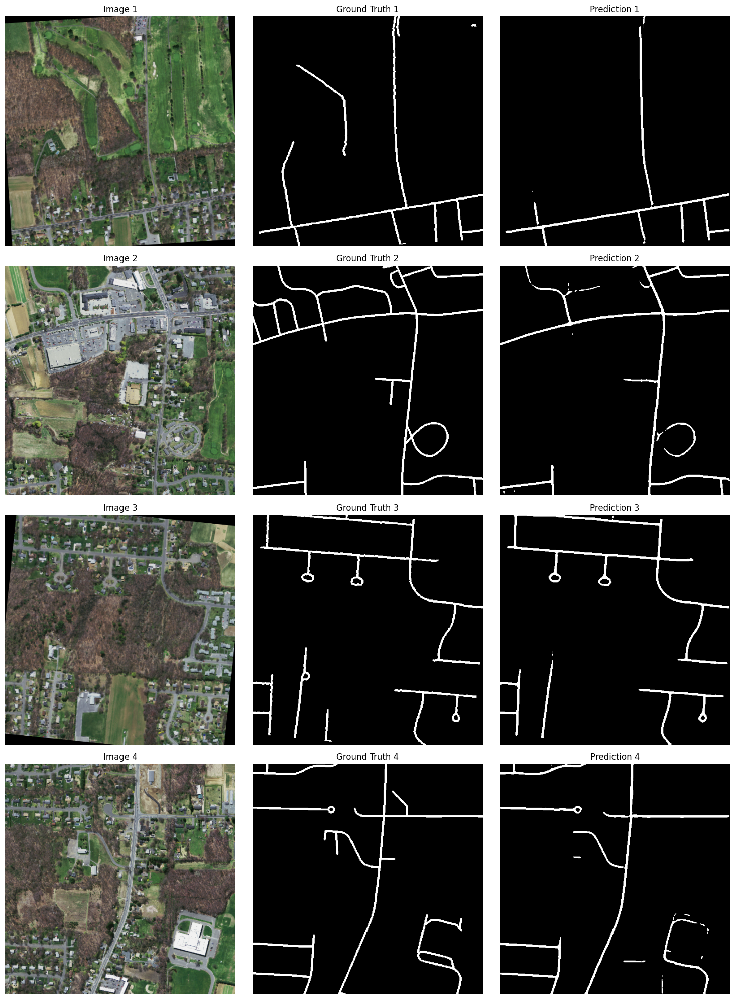

In [ ]:
def visualize_predictions(model, dataloader, device, num_samples=4, denormalize=True):
    model.eval()
    
    images, masks = next(iter(dataloader))
    images = images[:num_samples].to(device)
    masks = masks[:num_samples].cpu()
    
    # Предсказания
    with torch.no_grad():
        outputs = model(images)
        # Для бинарной сегментации (1 канал)
        if outputs.shape[1] == 1:
            preds = torch.sigmoid(outputs).cpu() > 0.5
            preds = preds.squeeze(1)
    
    # Денормализация изображений
    if denormalize:
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
    
    # Визуализация
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5*num_samples))
    
    for i in range(num_samples):
        img_np = images[i].cpu().numpy().transpose(1, 2, 0)
        if denormalize:
            img_np = img_np * std + mean
            img_np = np.clip(img_np, 0, 1)
        
        # Истинная маска
        mask_np = masks[i].numpy()
        
        # Предсказанная маска
        pred_np = preds[i].numpy()
        
        axes[i, 0].imshow(img_np)
        axes[i, 0].set_title(f'Image {i+1}', fontsize=12)
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(mask_np, cmap='gray')
        axes[i, 1].set_title(f'Ground Truth {i+1}', fontsize=12)
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(pred_np, cmap='gray')
        axes[i, 2].set_title(f'Prediction {i+1}', fontsize=12)
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.show()


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
visualize_predictions(model, val_dataloader, device, num_samples=4)

In [21]:
class TestDataset(Dataset):
    def __init__(self, path_dir_image, path_dir_label, transforms=None, crop_size=512, resize_to=1024):
        self.samples = []
        self.transforms = transforms
        self.crop_size = crop_size
        self.resize_to = resize_to
        
        self.crop_queue = deque()
        image_list_path = sorted(os.listdir(path_dir_image))
        
        for file in image_list_path:
            if file.endswith('.tiff'):
                label_file_name = file.replace('.tiff', '.tif')
                full_image_path = os.path.join(path_dir_image, file)
                full_label_path = os.path.join(path_dir_label, label_file_name)
            
                if os.path.exists(full_label_path):
                    self.samples.append((full_image_path, full_label_path))
            
    def __len__(self):
        return len(self.samples)
    
    def _generate_crops(self, img_path, mask_path):
        img = Image.open(img_path).convert('RGB')
        mask = Image.open(mask_path).convert('L')
        
        img = img.resize((self.resize_to, self.resize_to), Image.BILINEAR)
        mask = mask.resize((self.resize_to, self.resize_to), Image.NEAREST)
        
        img = np.array(img)
        mask = np.array(mask)
        mask = (mask > 0).astype(np.float32)
        
        step = self.crop_size
        crops = []
        
        for y in range(0, self.resize_to, step):
            if y + step > self.resize_to:
                break
            for x in range(0, self.resize_to, step):
                if x + step > self.resize_to:
                    break
                
                crop_img = img[y:y+step, x:x+step]
                crop_mask = mask[y:y+step, x:x+step]
                
                crops.append((crop_img, crop_mask))
        
        return crops
    
    def __getitem__(self, idx_phantom):
        if len(self.crop_queue) == 0:
            idx_real = idx_phantom % len(self.samples)
            img_path, mask_path = self.samples[idx_real]
            
            crops = self._generate_crops(img_path, mask_path)
            
            for crop_img, crop_mask in crops:
                self.crop_queue.append((crop_img, crop_mask))
                    
        img, mask = self.crop_queue.popleft()
        
        if self.transforms:
            augmented = self.transforms(image=img, mask=mask)
            img = augmented['image']
            mask = augmented['mask']
        
        mask = (mask > 0).long()
        
        return img, mask

In [ ]:
def test_step(model, test_dataloader, crop_size=512, resize_to=1024):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.eval()
    
    total_iou = 0.0
    total_dice = 0.0
    total_acc = 0.0
    num_processed = 0

    crops_buffer = []
    
    with torch.no_grad():
        for batch_idx, (image, mask) in enumerate(test_dataloader):
            image = image.to(device)
            mask = mask.to(device)
            
            outputs = model(image)
            
            pred = (torch.sigmoid(outputs) > 0.5).float().cpu().numpy()
            pred = pred.squeeze(0).squeeze(0)  # (H, W)
        
            mask_np = mask.cpu().numpy().squeeze()
            
            crops_buffer.append((pred, mask_np))
            
            # Когда накопили 4 кропа (для одного изображения 2x2), склеиваем
            if len(crops_buffer) == 4:
                # Создаём массивы для склейки
                full_pred = np.zeros((resize_to, resize_to), dtype=np.float32)
                full_mask = np.zeros((resize_to, resize_to), dtype=np.float32)
                
                # Предполагаем порядок кропов: (0,0), (0,1), (1,0), (1,1)
                positions = [(0, 0), (0, 1), (1, 0), (1, 1)]
                
                for (pred, mask_np), (y, x) in zip(crops_buffer, positions):
                    full_pred[y*crop_size:(y+1)*crop_size, x*crop_size:(x+1)*crop_size] = pred
                    full_mask[y*crop_size:(y+1)*crop_size, x*crop_size:(x+1)*crop_size] = mask_np
                
                # Вычисляем метрики
                pred_flat = full_pred.flatten()
                mask_flat = full_mask.flatten()
                
                tp = np.sum((pred_flat == 1) & (mask_flat == 1))
                fp = np.sum((pred_flat == 1) & (mask_flat == 0))
                fn = np.sum((pred_flat == 0) & (mask_flat == 1))
                tn = np.sum((pred_flat == 0) & (mask_flat == 0))
                
                iou = tp / (tp + fp + fn + 1e-6)
                dice = 2 * tp / (2 * tp + fp + fn + 1e-6)
                acc = (tp + tn) / (tp + tn + fp + fn + 1e-6)
                
                total_iou += iou
                total_dice += dice
                total_acc += acc
                num_processed += 1
                
                print(f"Изображение {num_processed}: IoU={iou:.4f}, DICE={dice:.4f}, ACC={acc:.4f}")
                
                # Очищаем буфер
                crops_buffer = []
    

    avg_iou = total_iou / num_processed
    avg_dice = total_dice / num_processed
    avg_acc = total_acc / num_processed
    
    print(f"СРЕДНИЕ МЕТРИКИ:")
    print(f"  IoU  = {avg_iou:.4f}")
    print(f"  DICE = {avg_dice:.4f}")
    print(f"  ACC  = {avg_acc:.4f}")

In [ ]:
test_transform = A.Compose(
    [A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]), A.ToTensorV2()]
)

test_dataset = TestDataset(
    path_dir_image=TEST_DATA_PATH,
    path_dir_label=TEST_DATA_LABEL_PATH,
    transforms=test_transform,
)


test_dataloader = DataLoader(
    dataset=test_dataset,
    batch_size=1,  
    shuffle=True,
    num_workers=2,  
    pin_memory=True,
    persistent_workers=True
)

test_step(model, test_dataloader)

Изображение 1: IoU=0.5975, DICE=0.7481, ACC=0.9722
Изображение 2: IoU=0.6428, DICE=0.7825, ACC=0.9754
Изображение 3: IoU=0.5997, DICE=0.7497, ACC=0.9844
Изображение 4: IoU=0.6029, DICE=0.7522, ACC=0.9830
Изображение 5: IoU=0.6490, DICE=0.7871, ACC=0.9855
Изображение 6: IoU=0.6667, DICE=0.8001, ACC=0.9781
Изображение 7: IoU=0.5924, DICE=0.7440, ACC=0.9662
Изображение 8: IoU=0.6446, DICE=0.7839, ACC=0.9686
Изображение 9: IoU=0.6628, DICE=0.7972, ACC=0.9767
Изображение 10: IoU=0.6557, DICE=0.7920, ACC=0.9851
Изображение 11: IoU=0.6712, DICE=0.8032, ACC=0.9760
Изображение 12: IoU=0.6106, DICE=0.7582, ACC=0.9647

СРЕДНИЕ МЕТРИКИ:
  IoU  = 0.6330
  DICE = 0.7749
  ACC  = 0.9763


In [24]:
def vizual_test_with_image(model, test_dataloader, crop_size=512, resize_to=1024):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.eval()
    
    crops_buffer = []
    results = []  # (full_image, full_pred, full_mask)
    
    with torch.no_grad():
        for batch_idx, (image, mask) in enumerate(test_dataloader):
            image = image.to(device)
            mask = mask.to(device)
            
            outputs = model(image)
            
            # Предсказание
            if outputs.shape[1] == 1:
                pred = (torch.sigmoid(outputs) > 0.5).float().cpu().numpy()
                pred = pred.squeeze(0).squeeze(0)
            else:
                pred = torch.argmax(outputs, dim=1).float().cpu().numpy()
                pred = pred.squeeze(0)
            
            mask_np = mask.cpu().numpy().squeeze()
            
            # Денормализация изображения для отображения
            img_np = image.cpu().numpy().squeeze().transpose(1, 2, 0)
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            img_np = img_np * std + mean
            img_np = np.clip(img_np, 0, 1)
            
            crops_buffer.append((pred, mask_np, img_np))
            
            # Склеиваем 4 кропа
            if len(crops_buffer) == 4:
                full_pred = np.zeros((resize_to, resize_to), dtype=np.float32)
                full_mask = np.zeros((resize_to, resize_to), dtype=np.float32)
                full_image = np.zeros((resize_to, resize_to, 3), dtype=np.float32)
                
                positions = [(0, 0), (0, 1), (1, 0), (1, 1)]
                
                for (pred, mask_np, img_np), (y, x) in zip(crops_buffer, positions):
                    full_pred[y*crop_size:(y+1)*crop_size, x*crop_size:(x+1)*crop_size] = pred
                    full_mask[y*crop_size:(y+1)*crop_size, x*crop_size:(x+1)*crop_size] = mask_np
                    full_image[y*crop_size:(y+1)*crop_size, x*crop_size:(x+1)*crop_size, :] = img_np
                
                results.append((full_image, full_pred, full_mask))
                crops_buffer = []
    
    if not results:
        print("Нет изображений для визуализации")
        return
    
    # Визуализация
    num_images = len(results)
    fig, axes = plt.subplots(num_images, 3, figsize=(15, 5*num_images))
    
    if num_images == 1:
        axes = axes.reshape(1, -1)
    
    for i, (full_image, full_pred, full_mask) in enumerate(results):
        # Вычисляем метрики
        intersection = np.sum((full_pred == 1) & (full_mask == 1))
        union = np.sum((full_pred == 1) | (full_mask == 1))
        iou = intersection / (union + 1e-6)
        
        dice = 2 * intersection / (np.sum(full_pred == 1) + np.sum(full_mask == 1) + 1e-6)
        
        # Изображение
        axes[i, 0].imshow(full_image)
        axes[i, 0].set_title(f'Image {i+1}', fontsize=12)
        axes[i, 0].axis('off')
        
        # Истинная маска
        axes[i, 1].imshow(full_mask, cmap='gray')
        axes[i, 1].set_title(f'Ground Truth', fontsize=12)
        axes[i, 1].axis('off')
        
        # Предсказание с метриками
        axes[i, 2].imshow(full_pred, cmap='gray')
        axes[i, 2].set_title(f'Prediction\nIoU={iou:.3f}, DICE={dice:.3f}', fontsize=12)
        axes[i, 2].axis('off')
    
    plt.suptitle(f'Test Results - {num_images} images', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()



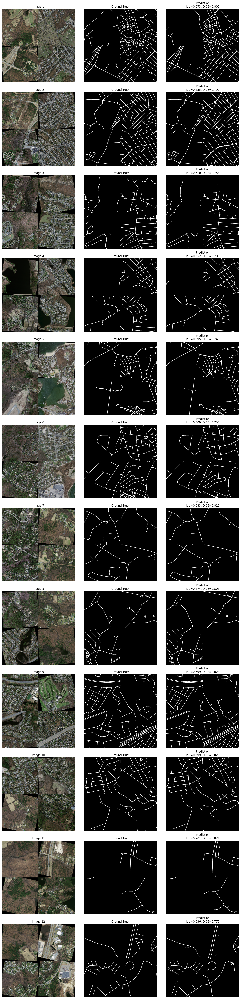

In [25]:
vizual_test_with_image(model, test_dataloader, crop_size=512, resize_to=1024)